In [7]:
import numpy as np

import math 
import numpy

from csv import reader
import pandas as pd

from tensorflow.python.keras.layers import Activation, Dropout, Dense


from keras.models import Sequential
from keras.layers import Dense, Activation, Flatten, Dropout

from keras.utils import to_categorical

from tensorflow import keras
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from tensorflow.python.keras.layers.convolutional import Conv1D
from tensorflow.python.keras.layers.convolutional import MaxPooling1D
from keras.layers import Dense, Activation, Flatten, Convolution1D, Dropout
from sklearn import preprocessing as pre
from keras.layers import LSTM
from keras.layers import GRU

from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

In [8]:
import csv

def write_to_csv(filename):
    with open(filename, mode='w') as file:
        writer = csv.writer(file)
        for i in range(957):
            writer.writerow('0')
        for i in range(110):
            writer.writerow('1')
        for i in range(1024):
            writer.writerow('2')
        for i in range(1774):
            writer.writerow('3')
        for i in range(1232):
            writer.writerow('4')
        for i in range(1246):
            writer.writerow('5')
        for i in range(830):
            writer.writerow('6')
write_to_csv('fer2013.csv')

In [34]:
from os import listdir
from os.path import isfile, join

angry_class = [f for f in listdir("./images/train/angry") if isfile(join("./images/train/angry", f))]
disgust_class = [f for f in listdir("./images/train/disgust") if isfile(join("./images/train/disgust", f))]
fear_class = [f for f in listdir("./images/train/fear") if isfile(join("./images/train/fear", f))]
happy_class = [f for f in listdir("./images/train/happy") if isfile(join("./images/train/happy", f))]
sad_class = [f for f in listdir("./images/train/sad") if isfile(join("./images/train/sad", f))]
surprise_class = [f for f in listdir("./images/train/surprise") if isfile(join("./images/train/surprise", f))]
neutral_class = [f for f in listdir("./images/train/neutral") if isfile(join("./images/train/neutral", f))]

In [35]:
import os

path = "./images/train/angry/"
number = 00000000

for i in angry_class:
    os.rename(path+i, str(number)+'.jpg')
    number+=1

In [39]:
path = "./images/train/disgust/"

for i in disgust_class:
    old_file = os.path.join(path, i)
    new_file = os.path.join(path, str(number)+'.jpg')
    os.rename(old_file, new_file)
    number+=1

In [40]:
path = "./images/train/fear/"

for i in fear_class:
    old_file = os.path.join(path, i)
    new_file = os.path.join(path, str(number)+'.jpg')
    os.rename(old_file, new_file)
    number+=1

In [41]:
path = "./images/train/happy/"

for i in happy_class:
    old_file = os.path.join(path, i)
    new_file = os.path.join(path, str(number)+'.jpg')
    os.rename(old_file, new_file)
    number+=1

In [42]:
path = "./images/train/neutral/"

for i in neutral_class:
    old_file = os.path.join(path, i)
    new_file = os.path.join(path, str(number)+'.jpg')
    os.rename(old_file, new_file)
    number+=1

In [43]:
path = "./images/train/sad/"

for i in sad_class:
    old_file = os.path.join(path, i)
    new_file = os.path.join(path, str(number)+'.jpg')
    os.rename(old_file, new_file)
    number+=1

In [44]:
path = "./images/train/surprise/"

for i in surprise_class:
    old_file = os.path.join(path, i)
    new_file = os.path.join(path, str(number)+'.jpg')
    os.rename(old_file, new_file)
    number+=1

In [54]:
from os import listdir
from os.path import isfile, join

angry_class = [f for f in listdir("./images/train/angry") if isfile(join("./images/train/angry", f))]
disgust_class = [f for f in listdir("./images/train/disgust") if isfile(join("./images/train/disgust", f))]
fear_class = [f for f in listdir("./images/train/fear") if isfile(join("./images/train/fear", f))]
happy_class = [f for f in listdir("./images/train/happy") if isfile(join("./images/train/happy", f))]
sad_class = [f for f in listdir("./images/train/sad") if isfile(join("./images/train/sad", f))]
surprise_class = [f for f in listdir("./images/train/surprise") if isfile(join("./images/train/surprise", f))]
neutral_class = [f for f in listdir("./images/train/neutral") if isfile(join("./images/train/neutral", f))]

In [55]:
len(angry_class)

7664

In [58]:
import csv
import random

class_img_counter = [0,0,0,0,0,0,0]

for i in range(57425):
    with open('fer2013.csv', mode='a') as file:
        writer = csv.writer(file)
        if i < len(angry_class):
            writer.writerow([angry_class[class_img_counter[0]],'0'])
            class_img_counter[0] += 1
        if i < len(disgust_class):
            writer.writerow([disgust_class[class_img_counter[1]],'1'])
            class_img_counter[1] += 1
        if i < len(fear_class):
            writer.writerow([fear_class[class_img_counter[2]],'2'])
            class_img_counter[2] += 1
        if i < len(happy_class):
            writer.writerow([happy_class[class_img_counter[3]],'3'])
            class_img_counter[3] += 1
        if i < len(neutral_class):
            writer.writerow([neutral_class[class_img_counter[4]],'4'])
            class_img_counter[4] += 1
        if i < len(sad_class):
            writer.writerow([sad_class[class_img_counter[5]],'5'])
            class_img_counter[5] += 1
        if i < len(surprise_class):
            writer.writerow([surprise_class[class_img_counter[6]],'6'])
            class_img_counter[6] += 1

In [2]:
#read rows from csv file
import csv
rows = []
# Open the CSV file
with open('fer2013.csv', 'r') as file:
    # Create a CSV reader object
    reader = csv.reader(file)
    
    # Iterate over each row in the CSV file
    for row in reader:
        # Access the data in each row
        rows.append(row[0])
rows


['63.jpg',
 '8439.jpg',
 '9733.jpg',
 '24084.jpg',
 '34297.jpg',
 '42301.jpg',
 '52112.jpg',
 '6400.jpg',
 '7722.jpg',
 '14147.jpg',
 '23933.jpg',
 '35189.jpg',
 '44770.jpg',
 '54563.jpg',
 '823.jpg',
 '8411.jpg',
 '13628.jpg',
 '19463.jpg',
 '36480.jpg',
 '47279.jpg',
 '56374.jpg',
 '4217.jpg',
 '8377.jpg',
 '12536.jpg',
 '28866.jpg',
 '37946.jpg',
 '50705.jpg',
 '56412.jpg',
 '3578.jpg',
 '8363.jpg',
 '15259.jpg',
 '16750.jpg',
 '40516.jpg',
 '41608.jpg',
 '54205.jpg',
 '2666.jpg',
 '7736.jpg',
 '10321.jpg',
 '26693.jpg',
 '40270.jpg',
 '46167.jpg',
 '52674.jpg',
 '5109.jpg',
 '8405.jpg',
 '11981.jpg',
 '16988.jpg',
 '31489.jpg',
 '49254.jpg',
 '54211.jpg',
 '2100.jpg',
 '7905.jpg',
 '10447.jpg',
 '20584.jpg',
 '32180.jpg',
 '46601.jpg',
 '52660.jpg',
 '4571.jpg',
 '8388.jpg',
 '11759.jpg',
 '17328.jpg',
 '35837.jpg',
 '49532.jpg',
 '51369.jpg',
 '7078.jpg',
 '7911.jpg',
 '16036.jpg',
 '30797.jpg',
 '32194.jpg',
 '50063.jpg',
 '56406.jpg',
 '1409.jpg',
 '7939.jpg',
 '12250.jpg',
 '21

In [64]:
# import module
import shutil
import os

classes = ["angry", "disgust", "fear", "happy", "neutral", "sad", "surprise"]
class_counter = 0

for i in rows:    
    while os.path.exists("./images/train/"+classes[class_counter]+"/"+i) is False:
        if class_counter == 6:
            class_counter = 0
        else:
            class_counter += 1
    shutil.copyfile("./images/train/"+classes[class_counter]+"/"+i, "./images/train/combined"+"/"+i)

In [75]:
# ResNet Features

import cv2
import numpy as np
import matplotlib.pyplot as plt
from keras.applications import ResNet101
from keras.preprocessing import image
from keras.applications.resnet import preprocess_input
import time

start_time = time.time()

csvfile = open("ResNet101Features.csv", "w")

model = ResNet101(weights='imagenet')

Final_ResNetFeature = np.zeros((1,1000), np.uint16)

for video_id in rows:
    try:
        print(video_id)
        file = "./images/train/combined/"+str(video_id)
        frame = cv2.imread(file)

        newsize = (224, 224)
        img = cv2.resize(frame, newsize, interpolation = cv2.INTER_AREA)
        
        x = np.array(img)
        x = np.expand_dims(x, axis=0)
        x = preprocess_input(x)
        
        features = model.predict(x)
        
        temp = 0
        for featuredata in features[0, :]:
            if(temp < 1000):
                csvfile.write(str(featuredata) + ",")
                temp = temp + 1
        csvfile.write("\n")
            
        print("--- %s seconds ---" % (time.time() - start_time))
    
    except:
        pass

csvfile.flush()
csvfile.close()


63.jpg


1/1 [==============================] - 7s 7s/step
--- 12.925765037536621 seconds ---
8439.jpg
1/1 [==============================] - 0s 113ms/step
--- 13.096807956695557 seconds ---
9733.jpg
1/1 [==============================] - 0s 71ms/step
--- 13.223630905151367 seconds ---
24084.jpg
1/1 [==============================] - 0s 484ms/step
--- 13.757457971572876 seconds ---
34297.jpg
1/1 [==============================] - 0s 70ms/step
--- 13.870848178863525 seconds ---
42301.jpg
1/1 [==============================] - 0s 69ms/step
--- 13.98401403427124 seconds ---
52112.jpg
1/1 [==============================] - 0s 74ms/step
--- 14.100598096847534 seconds ---
6400.jpg
1/1 [==============================] - 0s 76ms/step
--- 14.220999956130981 seconds ---
7722.jpg
1/1 [==============================] - 0s 91ms/step
--- 14.361695051193237 seconds ---
14147.jpg
1/1 [==============================] - 0s 190ms/step
--- 14.60221004486084 seconds ---
23933.jpg
1/1 [==============================

[ WARN:0@3262.013] global loadsave.cpp:248 findDecoder imread_('./images/train/combined/8.jpg'): can't open/read file: check file path/integrity


1/1 [==============================] - 0s 77ms/step
--- 2114.9084870815277 seconds ---
34130.jpg
1/1 [==============================] - 0s 71ms/step
--- 2115.022966146469 seconds ---
42065.jpg
1/1 [==============================] - 0s 86ms/step
--- 2115.1569969654083 seconds ---
56563.jpg
1/1 [==============================] - 0s 81ms/step
--- 2115.2913460731506 seconds ---
3541.jpg
1/1 [==============================] - 0s 95ms/step
--- 2115.438266992569 seconds ---
13571.jpg
1/1 [==============================] - 0s 113ms/step
--- 2115.6130340099335 seconds ---
25011.jpg
1/1 [==============================] - 0s 444ms/step
--- 2116.32177901268 seconds ---
34656.jpg
1/1 [==============================] - 0s 153ms/step
--- 2116.6409249305725 seconds ---
44414.jpg
1/1 [==============================] - 0s 91ms/step
--- 2116.7846128940582 seconds ---
52705.jpg
1/1 [==============================] - 0s 87ms/step
--- 2116.934760093689 seconds ---
2887.jpg
1/1 [=============================

In [5]:
import os
import cv2

def check_images(directory):
    problematic_images = []
    for root, _, files in os.walk(directory):
        for file in files:
            if file.endswith(('.jpg', '.jpeg', '.png', '.bmp', '.tiff')):
                file_path = os.path.join(root, file)
                image = cv2.imread(file_path)
                if image is None:
                    problematic_images.append(file_path)
                    print(f"Cannot open/read file: {file_path}")
    return problematic_images

# Replace './images/train/combined' with the path to your image directory
directory_path = './images/train/combined'
problematic_images = check_images(directory_path)

print(f"Total problematic images: {len(problematic_images)}")


Cannot open/read file: ./images/train/combined/7793.jpg
Cannot open/read file: ./images/train/combined/9762.jpg
Total problematic images: 2


In [76]:
not_working = []

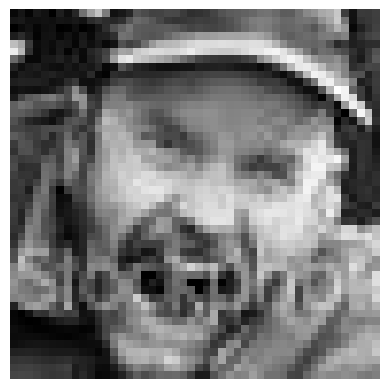

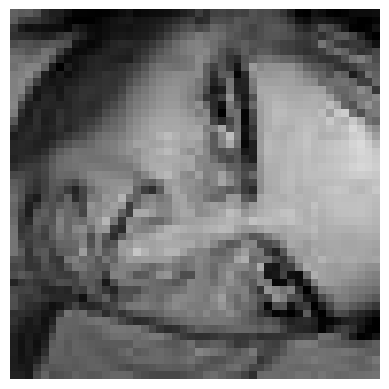

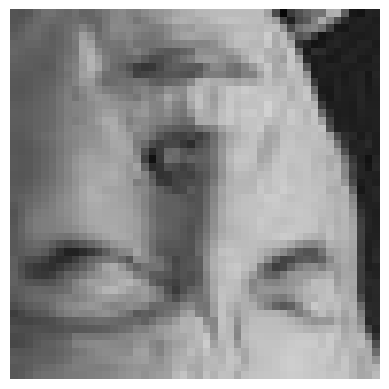

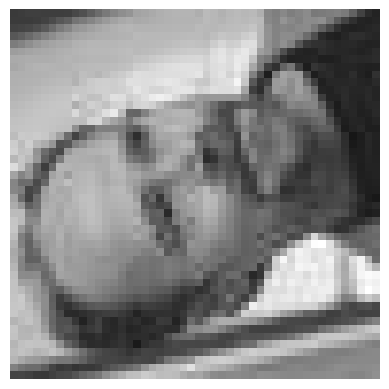

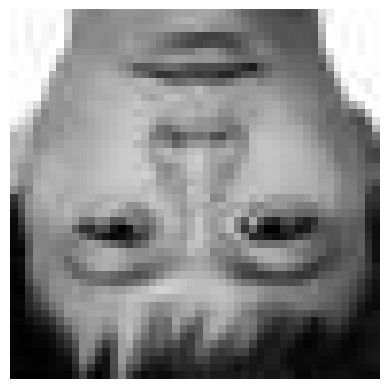

...

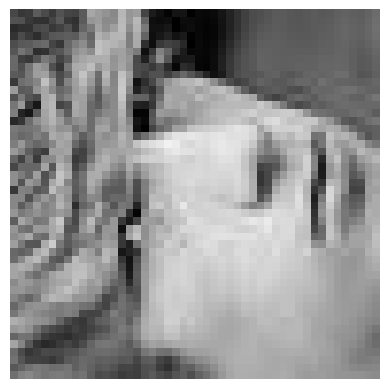

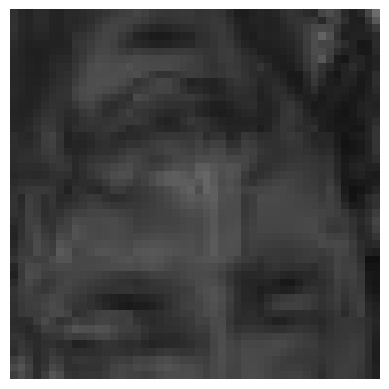

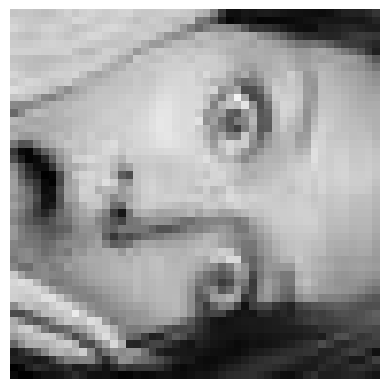

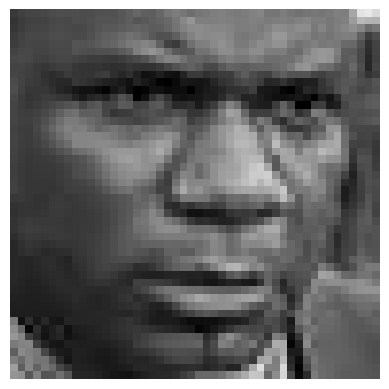

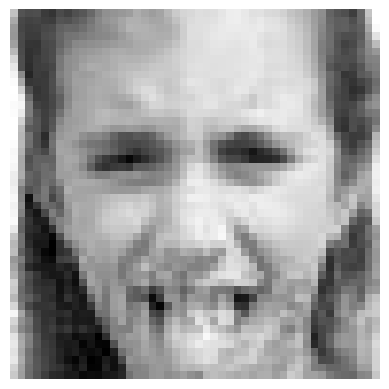

In [77]:
# VLDN Features

# -*- coding: utf-8 -*-
"""
Created on Fri Jun 24 11:24:45 2022

@author: mu2013
"""
#1 2 4 8 16 32 64 128 256 512 1024 2028 4096 8192 16384 32768 65536 131072 

import cv2
import numpy as np
import matplotlib.pyplot as plt

import time
start_time = time.time()

#Kirsch Masks
msk = np.zeros((3,3,8))
msk[:,:,0] = np.array([[- 3,- 3,5],[- 3,0,5],[- 3,- 3,5]])#east

msk[:,:,1] = np.array([[- 3,5,5],[- 3,0,5],[- 3,- 3,- 3]])#northeast

msk[:,:,2] = np.array([[5,5,5],[- 3,0,- 3],[- 3,- 3,- 3]])#north

msk[:,:,3] = np.array([[5,5,- 3],[5,0,- 3],[- 3,- 3,- 3]])#northwest

msk[:,:,4] = np.array([[5,- 3,- 3],[5,0,- 3],[5,- 3,- 3]])#west

msk[:,:,5] = np.array([[- 3,- 3,- 3],[5,0,- 3],[5,5,- 3]])#southwest

msk[:,:,6] = np.array([[- 3,- 3,- 3],[- 3,0,- 3],[5,5,5]])#south

msk[:,:,7] = np.array([[- 3,- 3,- 3],[- 3,0,5],[- 3,5,5]])#southeast
#(msk)

csvfile = open("VLDNFeatures.csv", "w")

#Final_VLBP = np.zeros((4096,1), np.uint8)
#video_id = 1
for video_id in rows:
    try:
        Final_VLDN = np.zeros((62,1), np.uint8)
        
        file = "./images/train/combined/"+str(video_id)
        frame = cv2.imread(file)


        plt.imshow(frame,cmap='gray')
        plt.axis('off')
        plt.show()
        
        height, width = frame.shape
        
        VLBP_value = np.zeros((height, width,3), np.uint16)
        
        VLDN_value = np.zeros((frame.shape[0], frame.shape[1]), np.uint16)
        
        indvals = np.zeros((24,1))
        
        r, c = frame.shape

        for i in range(r-2):
            for j in range(c-2):
                P1 = frame[i:i+3, j:j+3]
                val1 = np.zeros(8)
                for flag in range(8):
                    val1[flag] = np.sum(np.multiply(P1, msk[:, :, flag]))

                    zzz = np.zeros(24)
                    count = 8
                    for abcd in range(8):
                        zzz[abcd] = val1[abcd]

                    qqq = np.argsort(zzz)
                    qqq2 = np.zeros(24)
                    for abc in range(24):
                        if (qqq[abc] > 8 and qqq[abc] < 17):
                            qqq2[abc] = qqq[abc] - 8
                        elif (qqq[abc] > 16):
                            qqq2[abc] = qqq[abc] - 16
                        else:
                            qqq2[abc] = qqq[abc]

                    low_index = qqq2[0] 
                    high_index = qqq2[23]
                    
                    VLDN_value[i,j] =  high_index * 8 + low_index
                
        plt.axis('off')
        plt.show()
        Hist_vldn = cv2.calcHist([VLDN_value], [0], None, [62], [0, 62])

        print(Hist_vldn)


        temp = 0;
        for featuredata in Hist_vldn[0:248, 0]:
            if(temp<62):
                #print(str(featuredata))
                csvfile.write(str(featuredata)+",") 
                temp = temp + 1
        
        csvfile.write("\n")
        #else:
        #Final_VLDN = np.concatenate(Final_VLDN, Hist_vldn)
        csvfile.flush()

        #print(Final_VLBP)


        print("--- %s seconds ---" % (time.time() - start_time))
    
    except:
        not_working.append(video_id)
        pass
    
    #print(frame_number)


csvfile.close()


In [19]:
data_train = pd.read_csv("ResNet101Features.csv",header=None)
X_train1 = np.array(data_train)
X_train1 = [arr[:-1] for arr in X_train1]
X_train1 = np.array(X_train1)

data_train = pd.read_csv("VLDNFeatures.csv",header=None)
X_train2 = np.array(data_train)
X_train2 = [arr[:-1] for arr in X_train2]
X_train2 = np.array(X_train2)

X_train = np.hstack((X_train1,X_train2))
X_train.shape

(57423, 1062)

In [18]:


#and reading the datasets to use in training
data_train = pd.read_csv("Datasets/ResNet101Features.csv",header=None)
X_train1 = np.array(data_train)
X_train1 = [arr[:-1] for arr in X_train1]
X_train1 = np.array(X_train1)


data_train = pd.read_csv("Datasets/VLDNFeatures34.csv",header=None)
X_train2 = np.array(data_train)
X_train2 = [arr[:-1] for arr in X_train2]
X_train2 = np.array(X_train2)
# from sklearn.preprocessing import MinMaxScaler
# scaler = MinMaxScaler()
# X_train2 = scaler.fit_transform(X_train2)


#stacking the features horizontally to use in training
X_train = np.hstack((X_train1,X_train2))
X_train.shape

# Train_data = X_train.reshape(trainVideo,timeStamp,numFeature)
# #X_train_norm = pre.MinMaxScaler().fit_transform(X_train)
# #Train_data = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))

#    #reading the labels
# label_train = pd.read_csv("Datasets/LabelsCAS(ME)^2 .csv",header=None)
# label_train = np.array(label_train)

(10234, 1062)

In [22]:
trainVideo = 301
timeStamp = 434
numFeature = 467

data_train = pd.read_csv("ResNet101Features.csv",header=None)
X_train1 = np.array(data_train)
X_train1 = [arr[:-1] for arr in X_train1]
X_train1 = np.array(X_train1)

data_train = pd.read_csv("VLDNFeatures.csv",header=None)
X_train2 = np.array(data_train)
X_train2 = [arr[:-1] for arr in X_train2]
X_train2 = np.array(X_train2)

X_train = np.hstack((X_train1,X_train2))

Train_data = X_train.reshape(301, 446, 454)

label_train = (pd.read_csv("fer2013.csv",header=None)).iloc[:, -1]
label_train = np.array(label_train)

ACCURACIES = []

n_classes= 7
model = Sequential()
model.add(GRU(256, activation='relu', input_shape=(34, 1062), return_sequences=True))
model.add(Dropout(0.2))
model.add(GRU(128, return_sequences=True))
model.add(Dropout(0.2))
model.add(GRU(64))
model.add(Dropout(0.2))
model.add(Dense(150, activation='relu'))
model.add(Dense(100, activation='relu'))
model.add(Dense(n_classes, activation='softmax'))

model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

model.fit(Train_data, label_train, epochs=2000, verbose=1)

testX1 = pd.read_csv("ResNet101FeaturesTest.csv",header=None)
testX1 = np.array(testX1)
testX1 = [arr[:-1] for arr in testX1]
testX1 = np.array(testX1)

testX2 = pd.read_csv("VLDNFeaturesTest.csv",header=None)
testX2 = np.array(testX2)
testX2 = [arr[:-1] for arr in testX2]
testX2 = np.array(testX2)

testX = np.hstack((testX1,testX2))
testX = testX.reshape(40, 470, 431)


testY = (pd.read_csv("fer2013Test.csv",header=None)).iloc[:, -1]
testY = np.array(testY)
print(testY.shape)

_, accuracy = model.evaluate(testX, testY, verbose=0)
print("accuracy:")
print(accuracy)
ACCURACIES.append(accuracy)

n_classes= 7
model = Sequential()
model.add(GRU(256, activation='relu', input_shape=(34, 1062), return_sequences=True))
model.add(Dropout(0.2))
model.add(GRU(128, return_sequences=True))
model.add(Dropout(0.2))
model.add(GRU(64))
model.add(Dropout(0.2))
model.add(Dense(150, activation='relu'))
model.add(Dense(n_classes, activation='softmax'))

model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

model.fit(Train_data, label_train, epochs=2000, verbose=1)

_, accuracy = model.evaluate(testX, testY, verbose=0)
print("accuracy:")
print(accuracy)
ACCURACIES.append(accuracy)

n_classes= 7
model = Sequential()
model.add(GRU(128, activation='relu', input_shape=(34, 1062), return_sequences=True))
model.add(Dropout(0.2))
model.add(GRU(64))
model.add(Dropout(0.2))
model.add(Dense(150, activation='relu'))
model.add(Dense(100, activation='relu'))
model.add(Dense(n_classes, activation='softmax'))

model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

model.fit(Train_data, label_train, epochs=2000, verbose=1)

_, accuracy = model.evaluate(testX, testY, verbose=0)
print("accuracy:")
print(accuracy)
ACCURACIES.append(accuracy)

n_classes= 7
model = Sequential()
model.add(GRU(128, activation='relu', input_shape=(34, 1062), return_sequences=True))
model.add(Dropout(0.2))
model.add(GRU(64))
model.add(Dropout(0.2))
model.add(Dense(150, activation='relu'))
model.add(Dense(n_classes, activation='softmax'))

model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

model.fit(Train_data, label_train, epochs=2000, verbose=1)

_, accuracy = model.evaluate(testX, testY, verbose=0)
print("accuracy:")
print(accuracy)
ACCURACIES.append(accuracy)

n_classes= 7
model = Sequential()
model.add(GRU(256, activation='relu', input_shape=(34, 1062)))
model.add(Dropout(0.2))
model.add(Dense(150, activation='relu'))
model.add(Dense(100, activation='relu'))
model.add(Dense(n_classes, activation='softmax'))

model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

model.fit(Train_data, label_train, epochs=2000, verbose=1)

_, accuracy = model.evaluate(testX, testY, verbose=0)
print("accuracy:")
print(accuracy)
ACCURACIES.append(accuracy)

n_classes= 7
model = Sequential()
model.add(GRU(256, activation='relu', input_shape=(34, 1062)))
model.add(Dropout(0.2))
model.add(Dense(150, activation='relu'))
model.add(Dense(100, activation='relu'))
model.add(Dense(n_classes, activation='softmax'))

model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

model.fit(Train_data, label_train, epochs=2000, verbose=1)

_, accuracy = model.evaluate(testX, testY, verbose=0)
print("accuracy:")
print(accuracy)
ACCURACIES.append(accuracy)

print("-----------")
for i in ACCURACIES:
    print(i)

ValueError: cannot reshape array of size 60983226 into shape (301,434,467)

In [12]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet import ResNet101, preprocess_input
from tensorflow.keras.layers import GlobalAveragePooling2D

# Configuration parameters
train_dir = 'images/train'
test_dir = 'images/test'
img_height, img_width = 48, 48  # FER2013 image size
n_classes = 7  # Number of emotion classes in FER2013

# Function to load and preprocess images
def load_images_from_directory(directory):
    data_gen = ImageDataGenerator(rescale=1./255)
    data_flow = data_gen.flow_from_directory(directory, target_size=(img_height, img_width), 
                                             batch_size=1, class_mode='sparse', 
                                             shuffle=True)
    return data_flow

# Load the training data
train_data_flow = load_images_from_directory(train_dir)

# Function to extract features using ResNet101 and reshape them
def extract_and_reshape_features(data_flow, feature_extractor, timeStamp, numFeature):
    features = []
    labels = []
    for _ in range(len(data_flow)):
        images, batch_labels = next(data_flow)
        images = preprocess_input(images)
        batch_features = feature_extractor.predict(images)
        features.append(batch_features)
        labels.append(batch_labels)
    features = np.array(features).reshape(-1, timeStamp, numFeature)
    labels = np.array(labels)
    return features, labels

# Define feature extractor model
base_model = ResNet101(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))
base_model.trainable = False
global_average_layer = GlobalAveragePooling2D()
feature_extractor_model = tf.keras.Sequential([base_model, global_average_layer])

# Determine the number of samples, timestamps, and features
num_samples = len(train_data_flow)
timeStamp = 1  # Since each image is treated as one timestep
numFeature = feature_extractor_model.output_shape[-1]  # Number of features from the feature extractor

# Extract and reshape features for training data
Train_data, train_labels = extract_and_reshape_features(train_data_flow, feature_extractor_model, timeStamp, numFeature)

# Define and compile the model
def create_gru_model(input_shape, n_classes):
    model = Sequential()
    model.add(GRU(256, activation='relu', input_shape=input_shape, return_sequences=True))
    model.add(Dropout(0.2))
    model.add(GRU(128, return_sequences=True))
    model.add(Dropout(0.2))
    model.add(GRU(64))
    model.add(Dropout(0.2))
    model.add(Dense(150, activation='relu'))
    model.add(Dense(n_classes, activation='softmax'))
    model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model

input_shape = (timeStamp, numFeature)

# Create and train the model
model = create_gru_model(input_shape, n_classes)
model.fit(Train_data, train_labels, epochs=20, verbose=1)

# Load the test data
test_data_flow = load_images_from_directory(test_dir)

# Extract and reshape features for test data
testX, test_labels = extract_and_reshape_features(test_data_flow, feature_extractor_model, timeStamp, numFeature)

# Evaluate the model
_, accuracy = model.evaluate(testX, test_labels, verbose=0)
print("accuracy:")
print(accuracy)


Found 57424 images belonging to 7 classes.
1/1 [==============================] - 0s 105ms/step


KeyboardInterrupt: 